In [1]:
import ot
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Enable interactive mode
%matplotlib ipympl

In [2]:
! pwd

/home/dimakot55/workspace/gaussian-splatting/notebooks


In [3]:
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [4]:
loaded_data = np.load("clusters.npz")

# Access the arrays by their names
gaussians_xyz = loaded_data['gaussians_xyz']
gaussians_target_xyz = loaded_data['gaussians_target_xyz']
gaussians_shape_xyz = loaded_data['gaussians_shape_xyz']


Text(0.5, 0, 'Z Label')

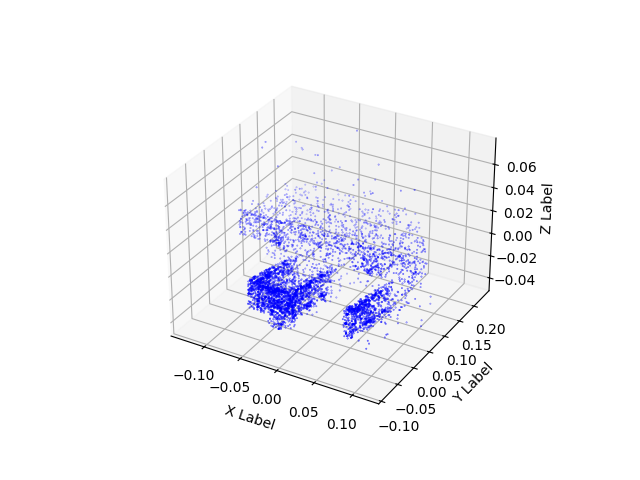

In [5]:


# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the scatter points
ax.scatter(gaussians_target_xyz[:,0], 
           gaussians_target_xyz[:,1], 
           gaussians_target_xyz[:,2], c='b', marker='o',s=0.1)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

In [6]:
# define color of points as three coordinates
gaussians_color = np.zeros_like(gaussians_target_xyz)
for i in range(3):
    gaussians_color[:, i] = (gaussians_target_xyz[:,i] - np.min(gaussians_target_xyz[:,i])) / \
        (np.max(gaussians_target_xyz[:,i]) - np.min(gaussians_target_xyz[:,i]))
    # make it rainbowy
    gaussians_color[:, i] *= 10
    gaussians_color[:, i] -= np.floor(gaussians_color[:, i])
    

Text(0.5, 0, 'Z Label')

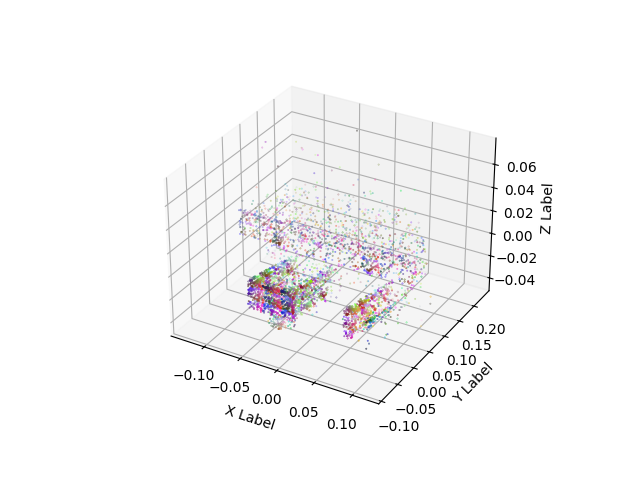

In [7]:

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the scatter points
ax.scatter(gaussians_target_xyz[:,0], 
           gaussians_target_xyz[:,1], 
           gaussians_target_xyz[:,2], marker='o',s=0.1,
           c=gaussians_color)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

Text(0.5, 0, 'Z Label')

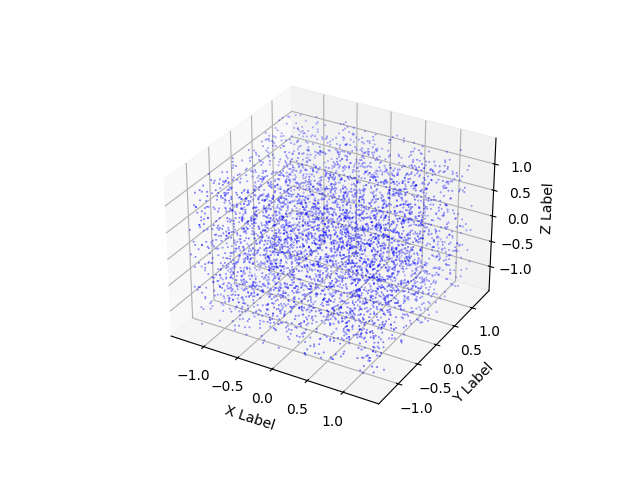

In [8]:


# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the scatter points
ax.scatter(gaussians_xyz[:,0], 
           gaussians_xyz[:,1], 
           gaussians_xyz[:,2], c='b', marker='o',s=0.1)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

In [9]:
plt.close()

In [10]:
gaussians_target_xyz = gaussians_target_xyz

Text(0.5, 0, 'Z Label')

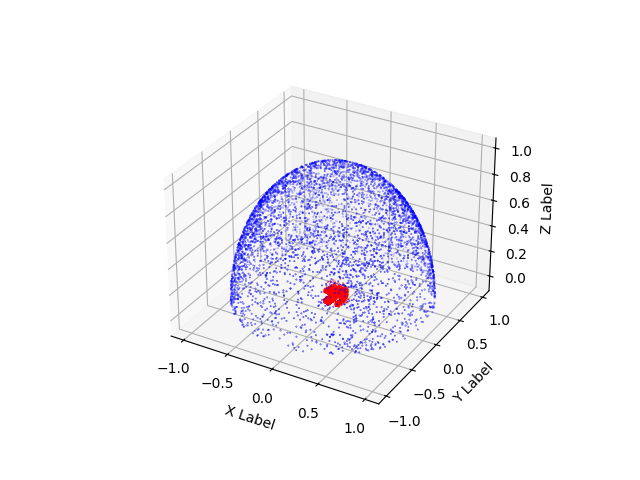

In [11]:


# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the scatter points
ax.scatter(gaussians_shape_xyz[:,0], 
           gaussians_shape_xyz[:,1], 
           gaussians_shape_xyz[:,2], c='b', marker='o',s=0.1)



# Plot the scatter points
ax.scatter(gaussians_target_xyz[:,0], 
           gaussians_target_xyz[:,1], 
           gaussians_target_xyz[:,2], c='r', marker='x',s=0.1)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

In [12]:
plt.close()

# Optimization

## Init targets and parameters to optimize

In [11]:
tensor = torch.randn(6,4)
k = 2
print(tensor)
sorted_values, _ = torch.sort(tensor, dim=1)  # Sort each row along dimension 1
print(sorted_values)
tensor_mask = (tensor <= sorted_values[:, k - 1:k])
print(tensor_mask)

tensor([[ 0.3446,  1.1536,  0.5094, -0.0706],
        [ 1.4455, -0.1826,  1.7460,  0.3169],
        [-0.7016,  1.0387,  0.7493,  0.1625],
        [ 0.2643, -1.6877, -0.4235,  0.8377],
        [ 0.1044,  0.2460, -0.4757,  0.3821],
        [ 0.3684, -0.8458,  0.9060,  0.8978]])
tensor([[-0.0706,  0.3446,  0.5094,  1.1536],
        [-0.1826,  0.3169,  1.4455,  1.7460],
        [-0.7016,  0.1625,  0.7493,  1.0387],
        [-1.6877, -0.4235,  0.2643,  0.8377],
        [-0.4757,  0.1044,  0.2460,  0.3821],
        [-0.8458,  0.3684,  0.8978,  0.9060]])
tensor([[ True, False, False,  True],
        [False,  True, False,  True],
        [ True, False, False,  True],
        [False,  True,  True, False],
        [ True, False,  True, False],
        [ True,  True, False, False]])


tensor([[0.0000, 0.0126, 0.0183,  ..., 0.2110, 0.2113, 0.2114],
        [0.0000, 0.0094, 0.0121,  ..., 0.2222, 0.2250, 0.2254],
        [0.0000, 0.0057, 0.0117,  ..., 0.2764, 0.2791, 0.2822],
        ...,
        [0.0000, 0.0004, 0.0005,  ..., 0.2509, 0.2515, 0.2521],
        [0.0000, 0.0014, 0.0015,  ..., 0.3110, 0.3111, 0.3119],
        [0.0000, 0.0009, 0.0009,  ..., 0.2719, 0.2744, 0.2764]],
       device='cuda:0')
loss_D_xyz:0.3653301, loss_D_to_shape:0.0026917
loss_D_xyz:0.1226937, loss_D_to_shape:0.0020522
loss_D_xyz:0.0105526, loss_D_to_shape:0.0015973
loss_D_xyz:0.0028903, loss_D_to_shape:0.0013730
loss_D_xyz:0.0003064, loss_D_to_shape:0.0011817
loss_D_xyz:0.0000358, loss_D_to_shape:0.0009879
loss_D_xyz:0.0000081, loss_D_to_shape:0.0008097
loss_D_xyz:0.0000032, loss_D_to_shape:0.0006519
loss_D_xyz:0.0000014, loss_D_to_shape:0.0005166
loss_D_xyz:0.0000009, loss_D_to_shape:0.0004033
loss_D_xyz:0.0000008, loss_D_to_shape:0.0003107
loss_D_xyz:0.0000008, loss_D_to_shape:0.0002369
lo

tensor([[ 0.0065,  0.1137, -0.0182],
        [-0.0323,  0.0166, -0.0336],
        [ 0.1162,  0.0670, -0.0320],
        ...,
        [-0.0438, -0.0154, -0.0159],
        [ 0.0827, -0.0263, -0.0149],
        [ 0.0832,  0.0265, -0.0195]], device='cuda:0')

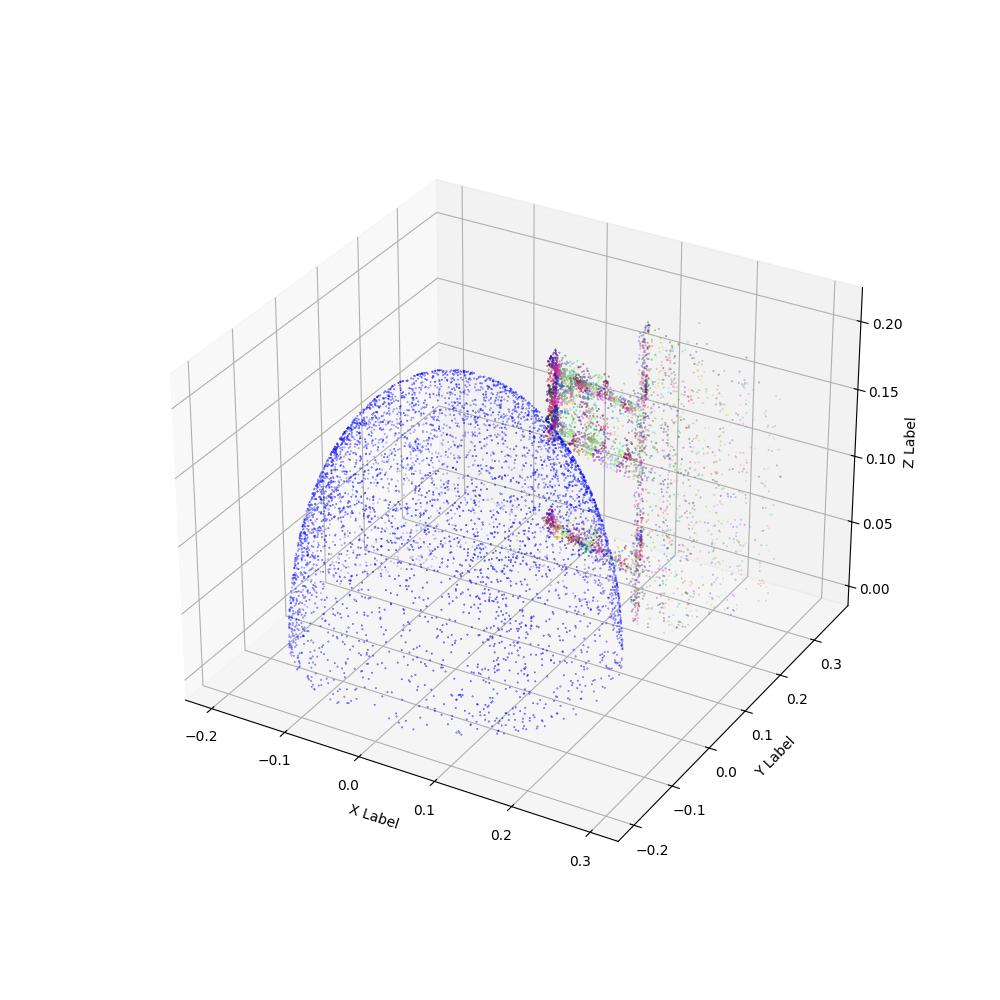

In [102]:
gaussians_target_xyz_torch = torch.tensor(gaussians_target_xyz * 1., device="cuda")
gaussians_shape_xyz_torch = torch.tensor(gaussians_shape_xyz / 5., device="cuda")
gaussians_xyz_torch = torch.nn.Parameter(torch.rand_like(torch.tensor(gaussians_xyz, device="cuda")))


D_pairwise_target = torch.cdist(gaussians_target_xyz_torch, gaussians_target_xyz_torch).detach().clone()
k = 4000
sorted_values, _ = torch.sort(D_pairwise_target, dim=1)  # Sort each row along dimension 1
print(sorted_values)
D_pairwise_target_mask = (D_pairwise_target <= sorted_values[:, k - 1:k])
D_pairwise_target_mask = D_pairwise_target_mask.to(dtype=torch.float32).detach().clone()

optimizer = torch.optim.Adam([gaussians_xyz_torch], lr=1)

for iter in range(401):
    D_pairwise = torch.cdist(gaussians_xyz_torch, gaussians_xyz_torch)
    
    D_to_shape = torch.cdist(gaussians_xyz_torch, gaussians_shape_xyz_torch)
    k = 20
    sorted_values, _ = torch.sort(D_to_shape, dim=1)  # Sort each row along dimension 1
    D_to_shape_mask = (D_to_shape <= sorted_values[:, k - 1:k])
    D_to_shape_mask = D_to_shape_mask.to(dtype=torch.float32)
    loss_D_to_shape = torch.mean(torch.square(D_to_shape)*D_to_shape_mask)
    loss_D_xyz = torch.mean(torch.square(D_pairwise_target - D_pairwise))#*D_pairwise_target_mask)
    
    loss = loss_D_xyz*1e0 + loss_D_to_shape * 3e-1
    
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    if iter % 20 == 0:
        print(f"loss_D_xyz:{loss_D_xyz:.7f}, loss_D_to_shape:{loss_D_to_shape:.7f}")
        

    
# Create a 3D scatter plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')


# Plot the scatter points
arr_shape = gaussians_shape_xyz_torch.detach().cpu().numpy()
ax.scatter(arr_shape[:,0], 
           arr_shape[:,1], 
           arr_shape[:,2], c='b', marker='o',s=0.1)

# Plot the scatter points
arr = gaussians_xyz_torch.detach().cpu().numpy()
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], 
           c=gaussians_color, # c='r', 
           marker='o',s=0.1)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
gaussians_target_xyz_torch






tensor([[ 0.0065,  0.1137, -0.0182],
        [-0.0323,  0.0166, -0.0336],
        [ 0.1162,  0.0670, -0.0320],
        ...,
        [-0.0438, -0.0154, -0.0159],
        [ 0.0827, -0.0263, -0.0149],
        [ 0.0832,  0.0265, -0.0195]], device='cuda:0')

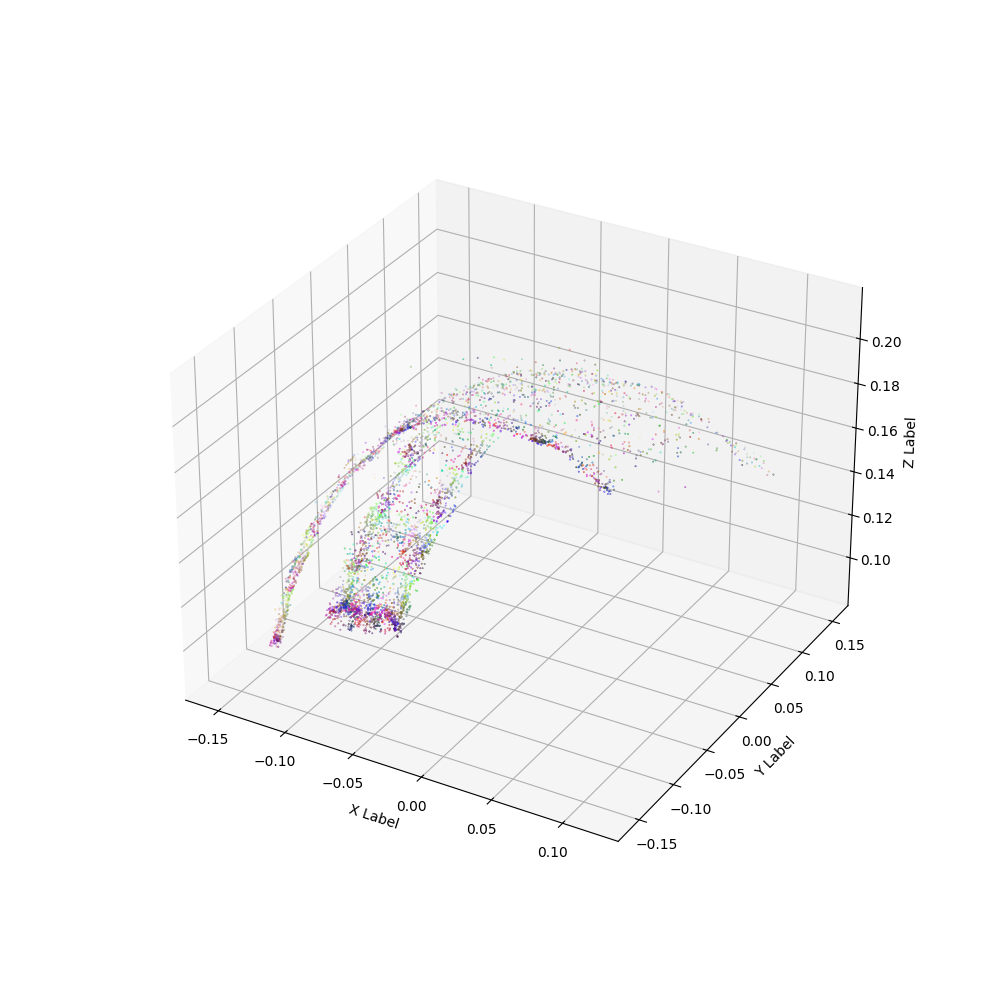

In [14]:

    
# Create a 3D scatter plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')


# Plot the scatter points
arr = gaussians_xyz_torch.detach().cpu().numpy()
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], 
           c=gaussians_color, # c='r', 
           marker='o',s=0.1)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
gaussians_target_xyz_torch


tensor([[ 0.0065,  0.1137, -0.0182],
        [-0.0323,  0.0166, -0.0336],
        [ 0.1162,  0.0670, -0.0320],
        ...,
        [-0.0438, -0.0154, -0.0159],
        [ 0.0827, -0.0263, -0.0149],
        [ 0.0832,  0.0265, -0.0195]], device='cuda:0')

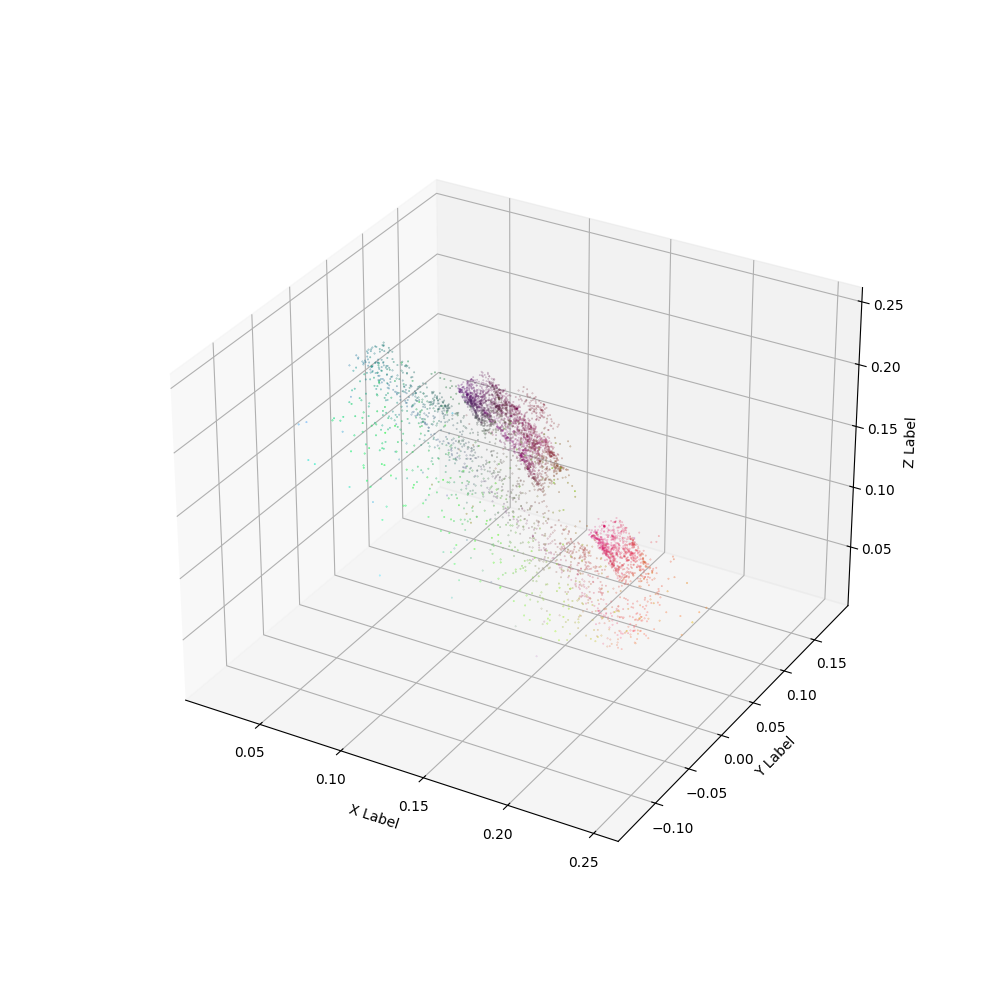

In [204]:

    
# Create a 3D scatter plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')


# Plot the scatter points
arr = gaussians_xyz_torch.detach().cpu().numpy()
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], µa
           
    
# Create a 3D scatter plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')


# Plot the scatter points
arr = gaussians_xyz_torch.detach().cpu().numpy()
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], 
           c=gaussians_color, # c='r', 
           marker='o',s=0.1)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
gaussians_target_xyz_torch

           c=gaussians_color, # c='r', 
           marker='o',s=0.1)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
gaussians_target_xyz_torch


In [16]:
plt.close()

Text(0.5, 0, 'Z Label')

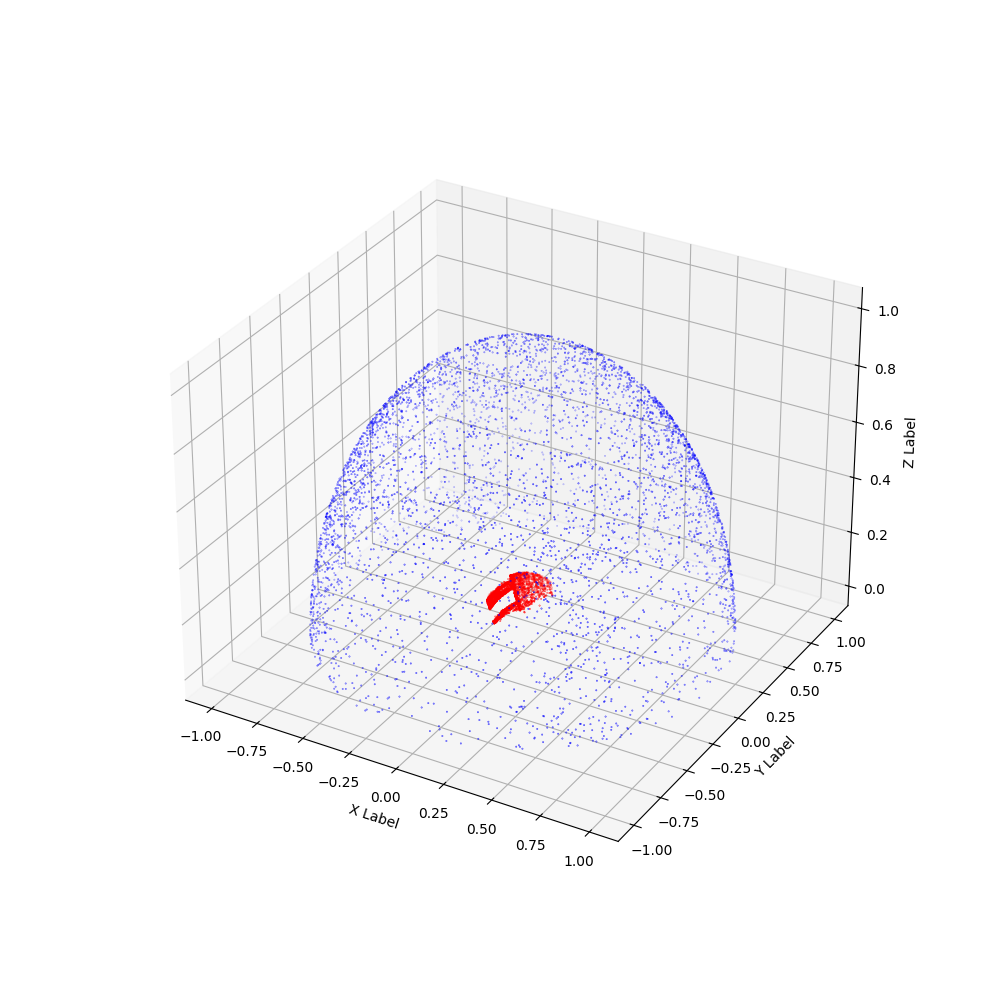

In [15]:

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')


# Plot the scatter points
ax.scatter(gaussians_shape_xyz[:,0], 
           gaussians_shape_xyz[:,1], 
           gaussians_shape_xyz[:,2], c='b', marker='o',s=0.1)

# Plot the scatter points
arr = gaussians_xyz_torch.detach().cpu().numpy()
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], c='r', marker='o',s=0.1)

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

In [17]:
def get_NNs_rots_distr(coords, rots, num_nns=20, device="cuda"):
    """
    Compute dot products between the rotations and vectors of offset to each of the num_nns neighbors 
    :param coords : array of size [m, d], where d is the dimensionality of the input 
    
    """
    m,d = coords.shape
    # d==3
    
    
    # Define the number of nearest neighbors (k)
    #num_nns = 5  # Replace with your desired value
    
    # Calculate pairwise Euclidean distances
    distances = torch.norm(coords.unsqueeze(1) - coords, dim=2, p=2)  # Shape [m, m]
    
    # Set the diagonal to a large value to exclude self-distances
    #torch.fill_diagonal_(distances, float('inf'))
    # Set the diagonal to a large value to exclude self-distances
    mask = torch.eye(m).bool()
    distances[mask] = float('inf')


    # Find the indices of the k nearest neighbors
    _, indices = torch.topk(distances, k=num_nns, largest=False, dim=1)
    #print("indices.shape:", indices.shape)
    #print("indices:", indices)
    # Gather the nearest neighbors and compute offsets
    #nearest_neighbors = torch.gather(coords.unsqueeze(1).expand(m, num_nns, d), 1, indices.unsqueeze(2).expand(m, num_nns, d))
    nearest_neighbors = coords[indices]
    #print("nearest_neighbors.shape:", nearest_neighbors.shape)
    #print("nearest_neighbors:", nearest_neighbors)
    offsets = nearest_neighbors - coords.unsqueeze(1).expand(m, num_nns, d)
    offsets = offsets #/ torch.norm(offsets, p=2, dim=-1, keepdim=True)
    rots = rots / torch.norm(rots, p=2, dim=-1, keepdim=True)
    
    # Now, 'nearest_neighbors' contains the k nearest neighbors for each point in shape [m, , d]
    # 'offsets' contains the coordinates of the nearest neighbors as offsets from the initial query points

    
    result = torch.zeros(size=(m,num_nns), dtype=torch.float32, device=device)
    for i in range(rots.shape[1] - d + 1):
        result += torch.einsum('ijk,ik->ij', offsets, rots[:,i:i+d])
    return result

In [20]:
device = "cuda"
rot_NNs_stats = get_NNs_rots_distr(coords=torch.tensor(gaussians_target_xyz * 1., device=device),
                                   rots=torch.tensor(loaded_data['gaussians_target_rotation'], device=device),
                                   num_nns=16*16, 
                                   device=device)

In [21]:
rot_NNs_stats

tensor([[ 3.7148e-03,  9.9024e-03, -1.3378e-02,  ...,  1.4555e-02,
          4.6161e-02,  3.6641e-03],
        [ 2.0785e-03, -3.2568e-03, -2.3816e-03,  ..., -1.6605e-02,
         -1.6912e-02, -1.5354e-02],
        [-1.2496e-03, -2.6187e-03, -6.5416e-03,  ..., -2.1500e-02,
         -1.5724e-02, -2.4984e-02],
        ...,
        [ 1.0108e-04,  5.0827e-04, -4.5099e-04,  ...,  1.2335e-02,
          4.5003e-03,  1.0893e-02],
        [ 1.6121e-05,  1.3795e-03,  8.2346e-04,  ..., -6.5982e-04,
         -1.4572e-05,  1.8095e-02],
        [-7.8023e-04, -3.8608e-04,  5.0366e-04,  ...,  1.6532e-02,
          2.4956e-02,  2.7196e-02]], device='cuda:0')

In [25]:
rot_NNs_stats.shape

torch.Size([4893, 256])

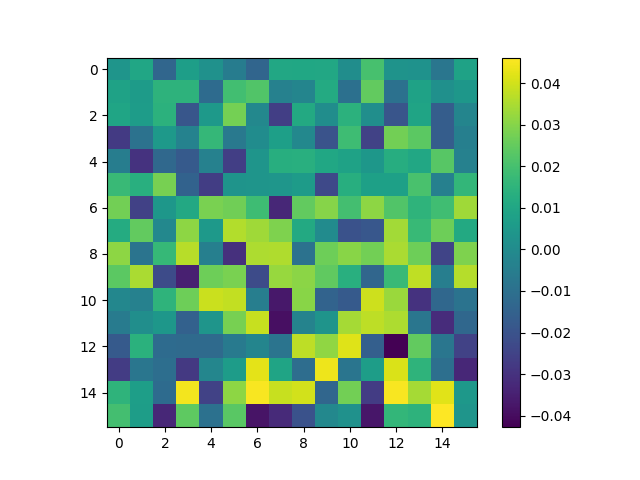

In [28]:
plt.close()
plt.figure()
plt.imshow(rot_NNs_stats[0].reshape(16,16).detach().cpu().numpy())
plt.colorbar()
plt.show()

In [29]:
rot_NNs_stats.shape

torch.Size([4893, 256])

# Visualize vector on top of the shape

In [103]:
device= "cuda"
gaussians_rot = torch.randn_like(torch.tensor(gaussians_target_xyz * 1., device=device)) / 40.
indices = np.random.permutation(len(gaussians_rot))[:20]

cmap = plt.get_cmap("Set1", max(indices))
colors = cmap(indices)


In [104]:
np.unique(indices)

array([  86,  412,  661, 1345, 1733, 2065, 2334, 2701, 2837, 2858, 3536,
       3619, 3726, 3876, 3877, 4316, 4431, 4548, 4650, 4798])

In [105]:
len(np.unique(indices))

20

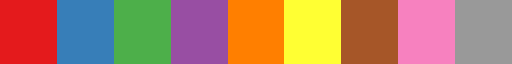

In [106]:
cmap

In [107]:
len(colors), len(indices)

(20, 20)

Text(0.5, 0, 'Z Label')

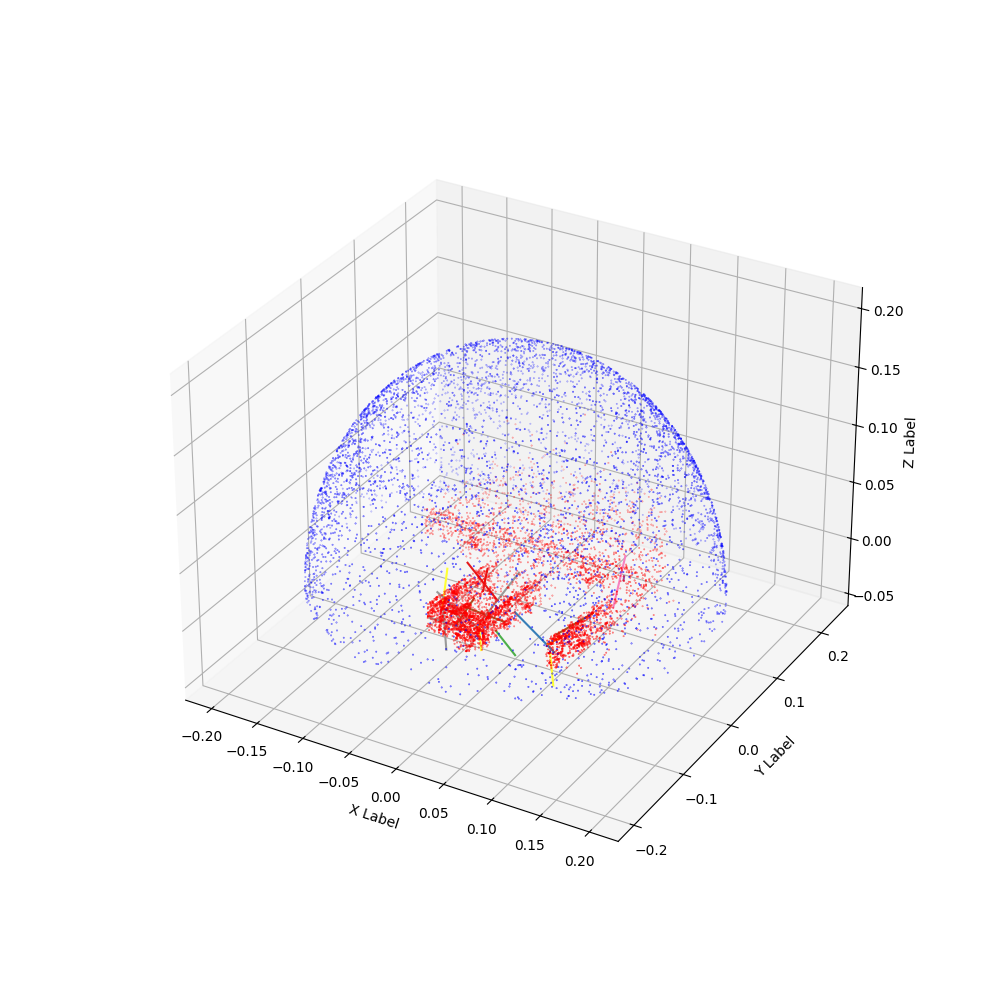

In [108]:

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')


# Plot the scatter points
arr_shape = gaussians_shape_xyz / 5.
ax.scatter(arr_shape[:,0], 
           arr_shape[:,1], 
           arr_shape[:,2], c='b', marker='o',s=0.1)

# Plot the scatter points
arr = gaussians_xyz_torch.detach().cpu().numpy()

arr = np.array(gaussians_target_xyz)
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], c='r', marker='o',s=0.1)

arr_rot = gaussians_rot.detach().cpu().numpy()
for i in range(len(indices)): 
    idx = indices[i]
    ax.plot([arr[idx,0], arr[idx,0] + arr_rot[idx,0]],
            [arr[idx,1], arr[idx,1] + arr_rot[idx,1]],
            [arr[idx,2], arr[idx,2] + arr_rot[idx,2]],
           color=colors[i])
            

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

Text(0.5, 0, 'Z Label')

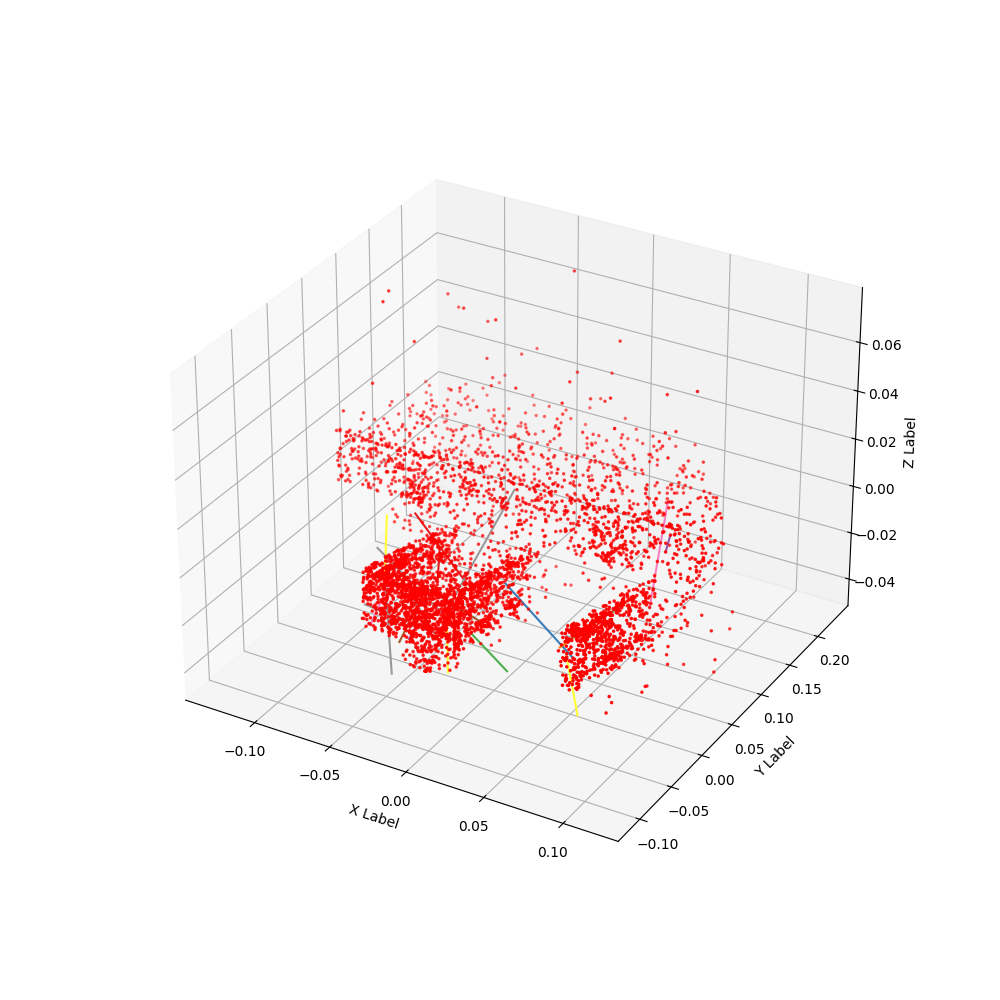

In [109]:

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')


# Plot the scatter points
# arr_shape = gaussians_shape_xyz / 5.
# ax.scatter(arr_shape[:,0], 
#            arr_shape[:,1], 
#            arr_shape[:,2], c='b', marker='o',s=0.1)

# Plot the scatter points
arr = gaussians_xyz_torch.detach().cpu().numpy()

arr = np.array(gaussians_target_xyz)
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], c='r', marker='o',s=2.4)

arr_rot = gaussians_rot.detach().cpu().numpy()
for i in range(len(indices)): 
    idx = indices[i]
    ax.plot([arr[idx,0], arr[idx,0] + arr_rot[idx,0]],
            [arr[idx,1], arr[idx,1] + arr_rot[idx,1]],
            [arr[idx,2], arr[idx,2] + arr_rot[idx,2]],
           color=colors[i])
            

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

yo


Text(0.5, 0, 'Z Label')

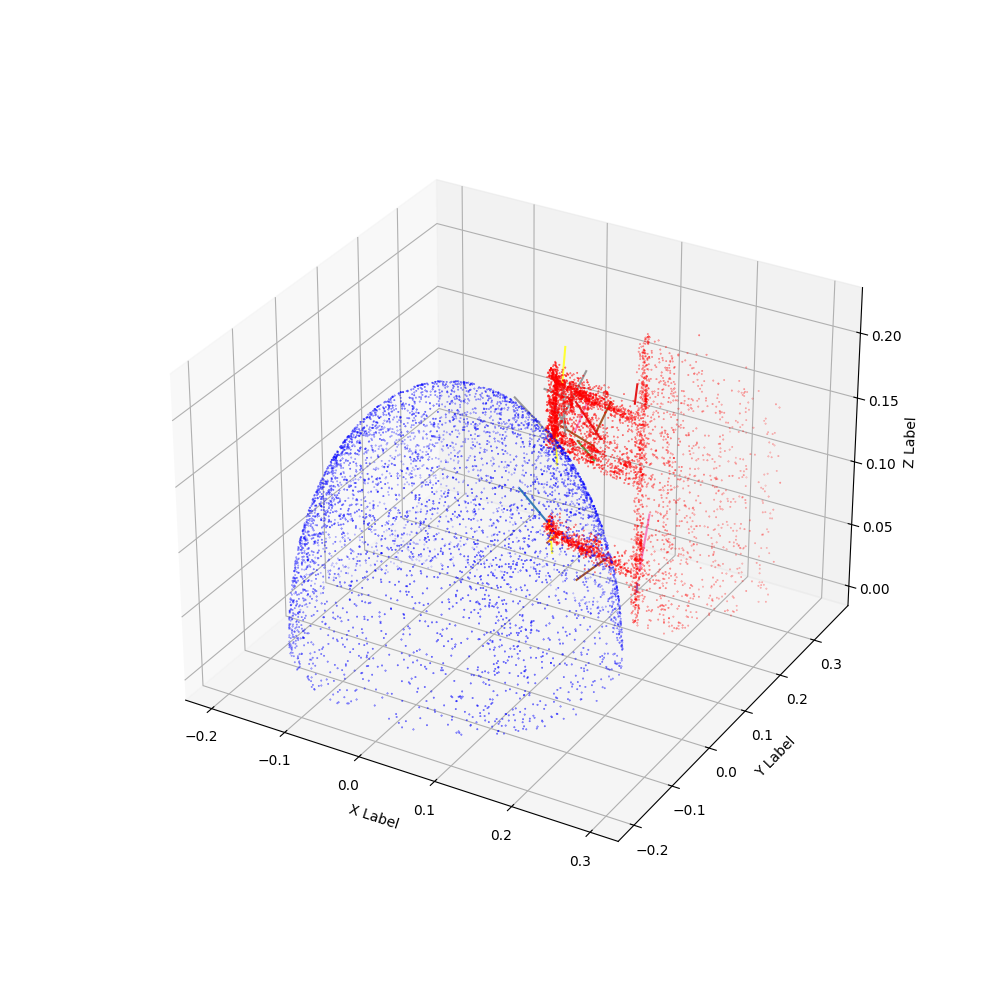

In [110]:
print("yo")
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')


# Plot the scatter points
arr_shape = gaussians_shape_xyz / 5.
ax.scatter(arr_shape[:,0], 
           arr_shape[:,1], 
           arr_shape[:,2], c='b', marker='o',s=0.1)

# Plot the scatter points
arr = gaussians_xyz_torch.detach().cpu().numpy()

#arr = np.array(gaussians_target_xyz)
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], c='r', marker='o',s=0.1)

arr_rot = gaussians_rot.detach().cpu().numpy()
for i in range(len(indices)): 
    idx = indices[i]
    ax.plot([arr[idx,0], arr[idx,0] + arr_rot[idx,0]],
            [arr[idx,1], arr[idx,1] + arr_rot[idx,1]],
            [arr[idx,2], arr[idx,2] + arr_rot[idx,2]],
           color=colors[i])
            

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

## Now optimize the rotations. 

In [111]:
plt.hist(rots_distr[0].detach().cpu().numpy(), lable="current distribusion")
plt.show()

AttributeError: Patch3D.set() got an unexpected keyword argument 'lable'

In [141]:
def get_NNs_rots_distr(coords, rots, nns_indices=None, num_nns=20, device="cuda"):
    """
    Compute dot products between the rotations and vectors of offset to each of the num_nns neighbors 
    :param coords : array of size [m, d], where d is the dimensionality of the input 
    
    """
    m,d = coords.shape
    # d==3
    
    
    # Define the number of nearest neighbors (k)
    #num_nns = 5  # Replace with your desired value
    
    # Calculate pairwise Euclidean distances
    distances = torch.norm(coords.unsqueeze(1) - coords, dim=2, p=2)  # Shape [m, m]
    
    # Set the diagonal to a large value to exclude self-distances
    #torch.fill_diagonal_(distances, float('inf'))
    # Set the diagonal to a large value to exclude self-distances
    # mask = torch.eye(m).bool()
    # distances[mask] = float('inf')


    if nns_indices is None:
        # Find the indices of the k nearest neighbors
        _, nns_indices = torch.topk(distances, k=num_nns, largest=False, dim=-1)
    #print("indices.shape:", indices.shape)
    #print("indices:", indices)
    # Gather the nearest neighbors and compute offsets
    #nearest_neighbors = torch.gather(coords.unsqueeze(1).expand(m, num_nns, d), 1, indices.unsqueeze(2).expand(m, num_nns, d))
    nearest_neighbors = coords[nns_indices]
    #print("nearest_neighbors.shape:", nearest_neighbors.shape)
    #print("nearest_neighbors:", nearest_neighbors)
    offsets = nearest_neighbors - coords.unsqueeze(1).expand(m, num_nns, d)
    offsets = offsets #/ torch.norm(offsets, p=2, dim=-1, keepdim=True)
    rots = rots #/ torch.norm(rots, p=2, dim=-1, keepdim=True)
    
    # Now, 'nearest_neighbors' contains the k nearest neighbors for each point in shape [m, , d]
    # 'offsets' contains the coordinates of the nearest neighbors as offsets from the initial query points

    
    result = torch.zeros(size=(m,num_nns), dtype=torch.float32, device=device)
    for i in range(rots.shape[1] - d + 1):
        result += torch.einsum('ijk,ik->ij', offsets, rots[:,i:i+d])
    return result, nns_indices

In [172]:
def get_NNs_rots_distr(coords, rots, nns_indices=None, num_nns=20, device="cuda"):
    """
    Compute dot products between the rotations and vectors of offset to each of the num_nns neighbors 
    :param coords : array of size [m, d], where d is the dimensionality of the input 
    
    """
    m,d = coords.shape
    # Calculate pairwise Euclidean distances
    distances = torch.cdist(coords, coords)  # Shape [m, m]

    if nns_indices is None:
        # Find the indices of the k nearest neighbors
        _, nns_indices = torch.topk(distances, k=num_nns, sorted=True, largest=False, dim=-1)
    #print("indices.shape:", indices.shape)
    #print("indices:", indices)
    # Gather the nearest neighbors and compute offsets
    #nearest_neighbors = torch.gather(coords.unsqueeze(1).expand(m, num_nns, d), 1, indices.unsqueeze(2).expand(m, num_nns, d))
    nearest_neighbors = coords[nns_indices]
    #print("nearest_neighbors.shape:", nearest_neighbors.shape)
    #print("nearest_neighbors:", nearest_neighbors)
    nns_offsets = nearest_neighbors - coords.unsqueeze(1)
    nns_offsets = nns_offsets #/ torch.norm(nns_offsets, p=2, dim=-1, keepdim=True)
    rots = rots #/ torch.norm(rots, p=2, dim=-1, keepdim=True)
    
    # Now, 'nearest_neighbors' contains the k nearest neighbors for each point in shape [m, , d]
    # 'offsets' contains the coordinates of the nearest neighbors as offsets from the initial query points

    
    result = torch.zeros(size=(m,num_nns), dtype=torch.float32, device=device)
    #print("nns_offsets.shape", nns_offsets.shape)
    #print("rots[:,0:3].shape", rots[:,0:3].shape)
    #result 
    for i in range(rots.shape[1] - d + 1):
        #result += torch.einsum('ijk,ik->ij', offsets, rots[:,i:i+d])
        #result += torch.cdist(nns_offsets, rots[:,i:i+d])
        # just compute L2 distance between every offset and the rotation vector
        result = torch.sum(torch.square(nns_offsets - rots[:,i:i+d].unsqueeze(1)), axis=-1)
    #print("result.shape", result.shape)
    return result, nns_indices

loss_rots_distr:0.0830749


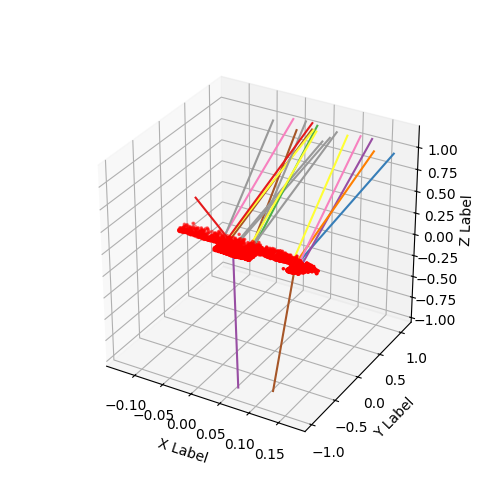

loss_rots_distr:0.0003521


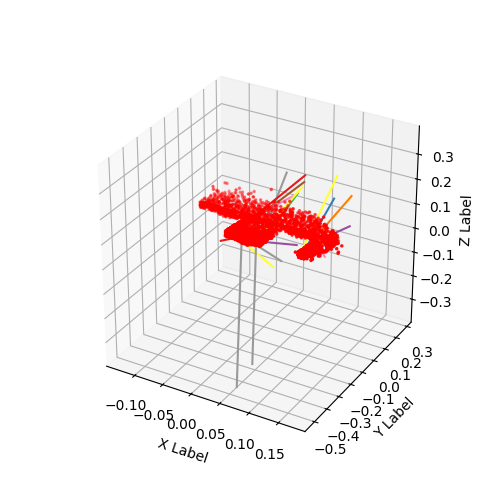

loss_rots_distr:0.0001886


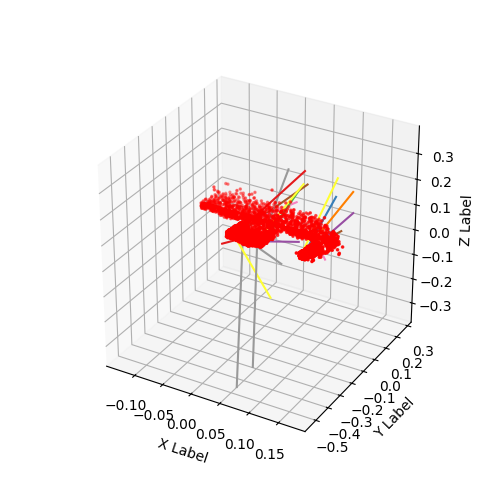

loss_rots_distr:0.0001310


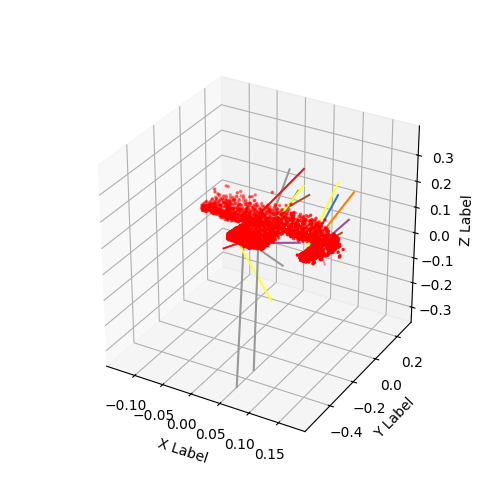

loss_rots_distr:0.0000938


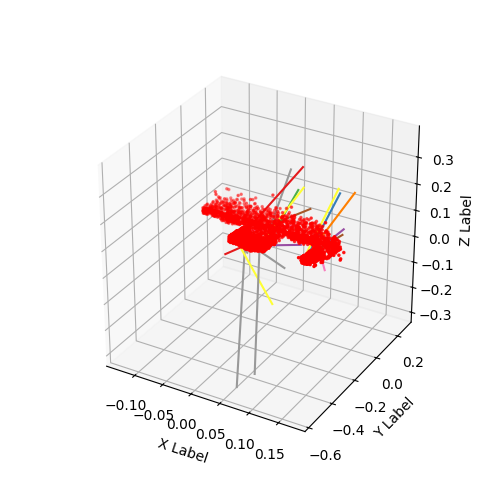

loss_rots_distr:0.0000711


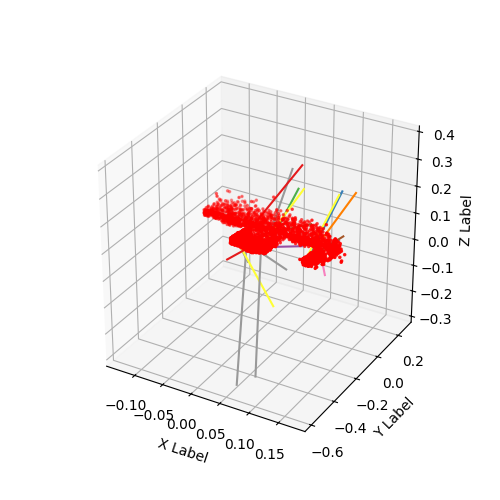

loss_rots_distr:0.0000546


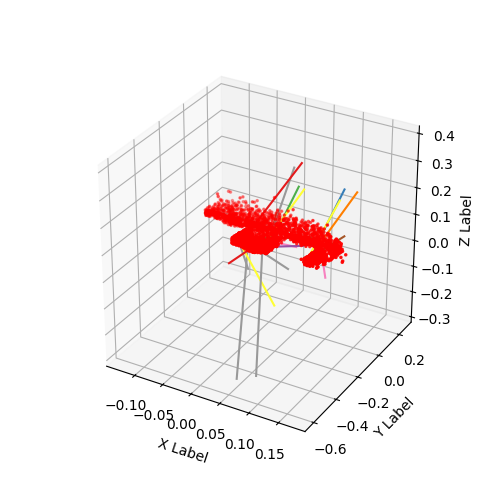

loss_rots_distr:0.0000437


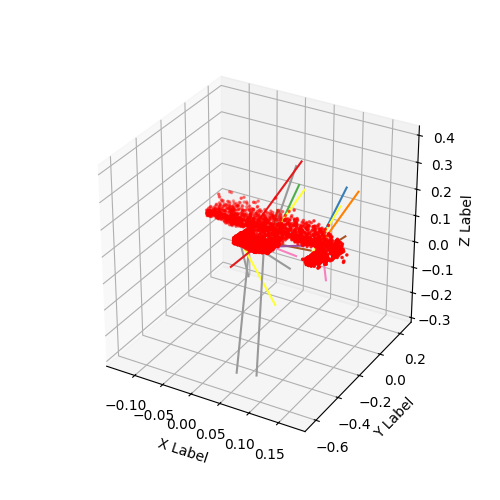

loss_rots_distr:0.0000386


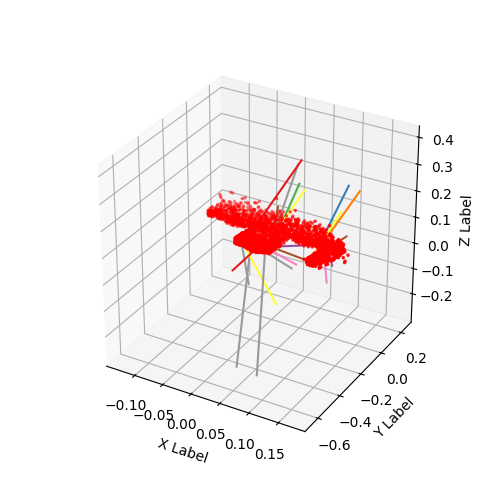

loss_rots_distr:0.0000638


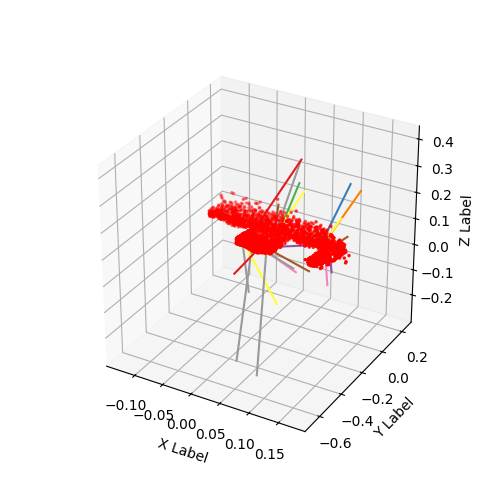

loss_rots_distr:0.0000324


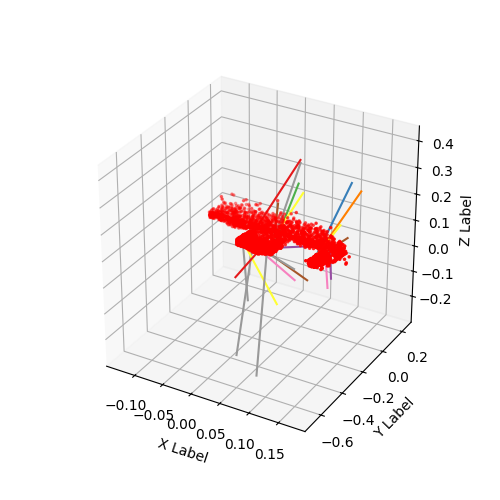

loss_rots_distr:0.0000509


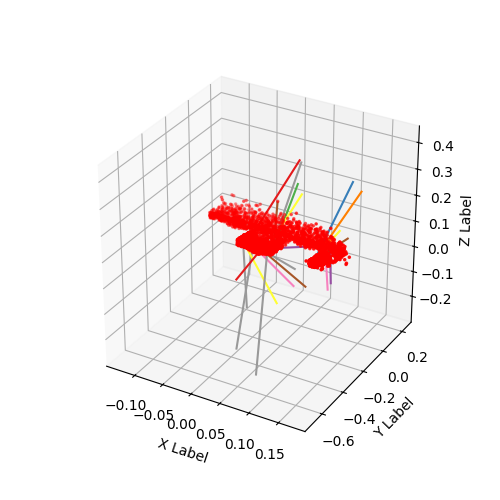

loss_rots_distr:0.0000426


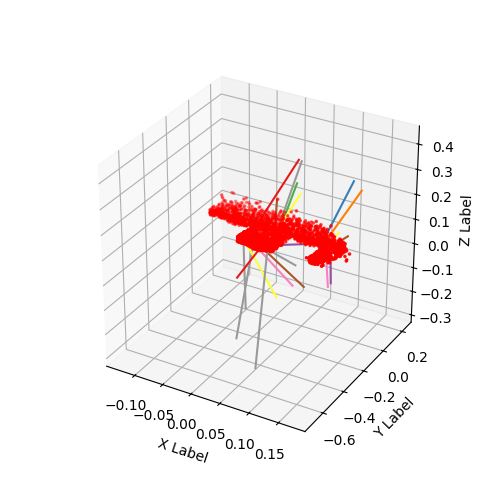

loss_rots_distr:0.0000783


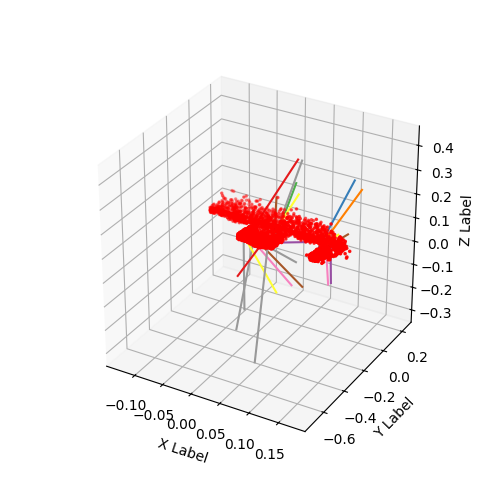

loss_rots_distr:0.0000424


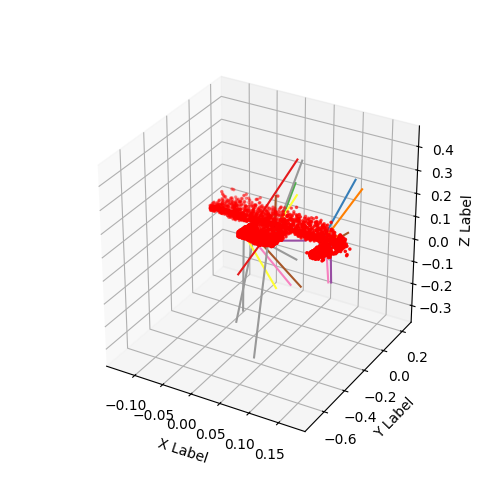

loss_rots_distr:0.0000767


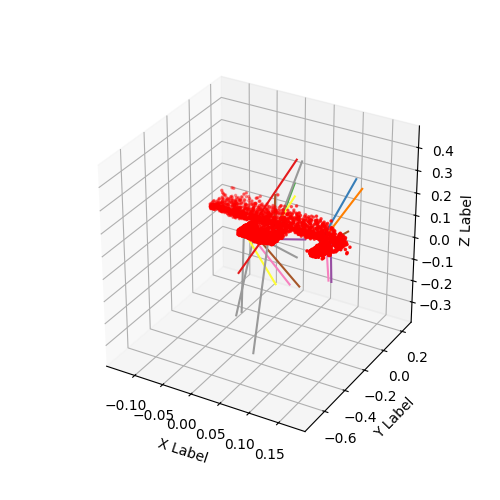

loss_rots_distr:0.0000706


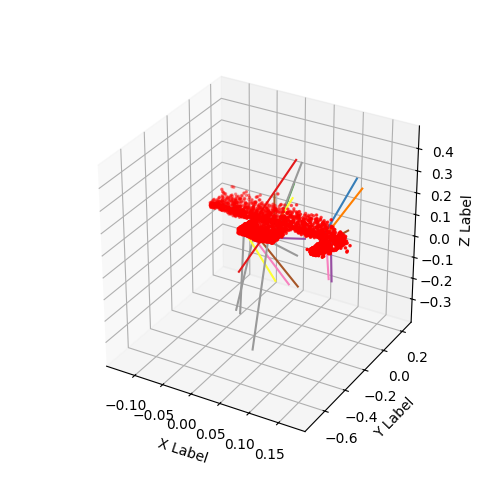

loss_rots_distr:0.0000649


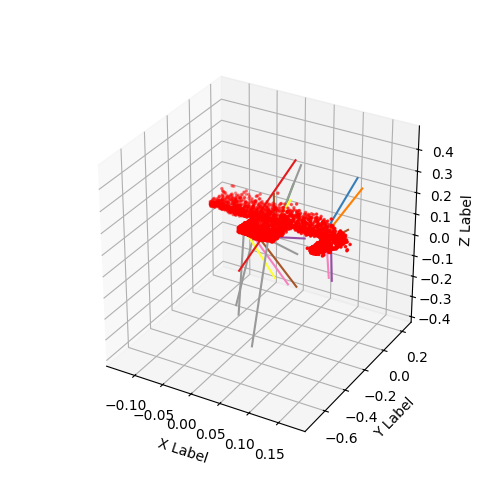

loss_rots_distr:0.0000418


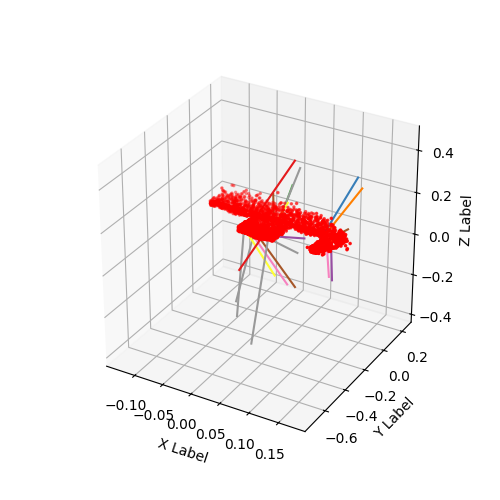

loss_rots_distr:0.0000627


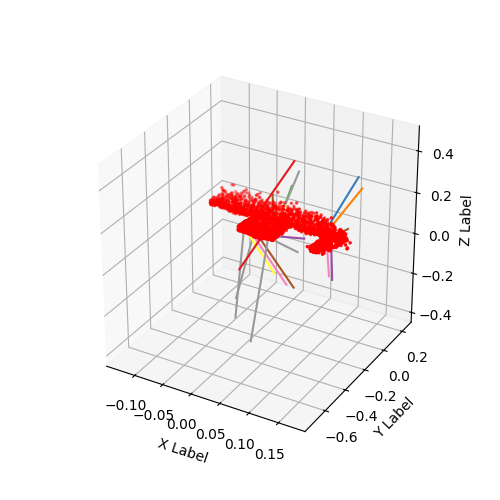

loss_rots_distr:0.0000649


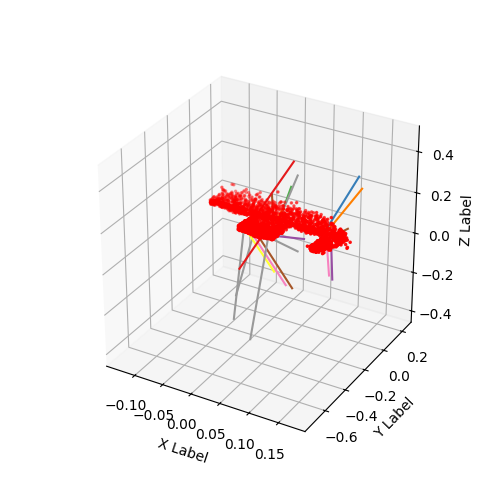

loss_rots_distr:0.0001125


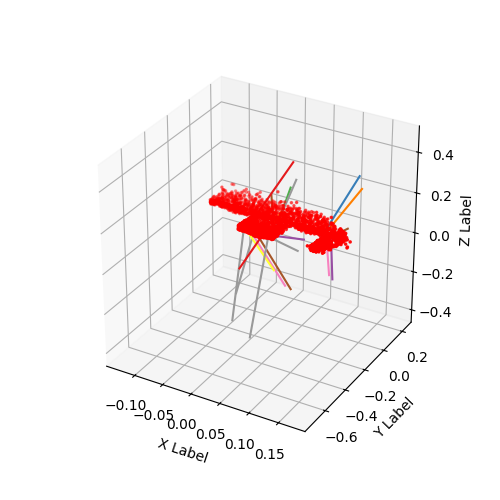

loss_rots_distr:0.0001029


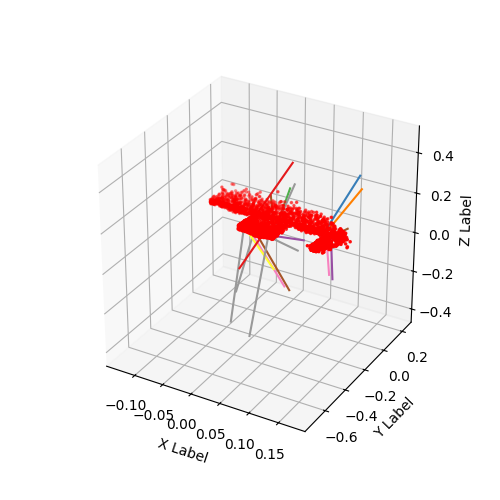

loss_rots_distr:0.0003489


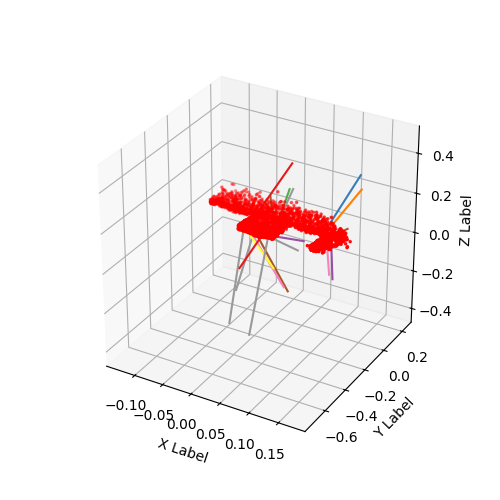

loss_rots_distr:0.0001132


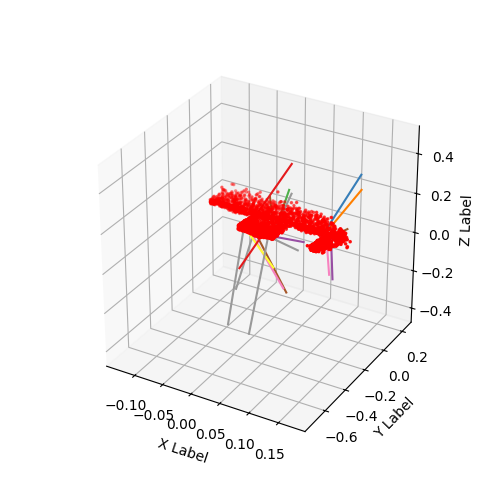

In [195]:
device="cuda"
gaussians_target_xyz_torch = torch.tensor(gaussians_target_xyz * 1., device=device)
gaussians_target_rots_torch = torch.tensor(loaded_data['gaussians_target_rotation'], device=device)

gaussians_rots_torch = torch.nn.Parameter(torch.rand_like(torch.tensor(loaded_data['gaussians_target_rotation'], 
                                                                       device=device))* 1e-1) 


# gaussians_rots_torch = torch.nn.Parameter(torch.tensor(loaded_data['gaussians_target_rotation'], 
#                                                                        device=device))

rots_distr_target, nns_indices = get_NNs_rots_distr(coords=gaussians_target_xyz_torch,# / torch.norm(gaussians_target_xyz_torch, p=2, dim=1, keepdim=True),
                                       rots=gaussians_target_rots_torch, # / torch.norm(gaussians_target_rots_torch, p=2, dim=1, keepdim=True),
                                       nns_indices=None,
                                       num_nns=300, 
                                       device=device)

optimizer = torch.optim.Adam([gaussians_rots_torch], lr=1e0)

gaussians_xyz_torch_optimized = gaussians_xyz_torch.clone()
#gaussians_xyz_torch_optimized.requires_grad_(False)

for iter in range(2401):
    
    rots_distr,_ = get_NNs_rots_distr(coords=gaussians_target_xyz_torch,# / torch.norm(gaussians_xyz_torch, p=2, dim=1, keepdim=True),
                                       rots=gaussians_rots_torch, # / torch.norm(gaussians_rots_torch, p=2, dim=1, keepdim=True),
                                    nns_indices=nns_indices,   
                                    num_nns=300, 
                                       device=device)
    
    loss_rots_distr = torch.mean(torch.square(rots_distr - rots_distr_target))
    loss = loss_rots_distr
    
    loss.backward()
    optimizer.step()
    optimizer.zero_grad()
    # with torch.no_grad():
    #     gaussians_rots_torch = gaussians_rots_torch / torch.norm(gaussians_rots_torch, p=2, dim=1, keepdim=True)
    if iter % 100 == 0:
        print(f"loss_rots_distr:{loss_rots_distr:.7f}")
        
        fig = plt.figure(figsize=(5,5))
        ax = fig.add_subplot(111, projection='3d')
        ax.set_aspect('equal')
        
        # Plot the scatter points
        # arr_shape = gaussians_shape_xyz / 5.
        # ax.scatter(arr_shape[:,0], 
        #            arr_shape[:,1], 
        #            arr_shape[:,2], c='b', marker='o',s=0.1)
        
        # Plot the scatter points
        arr = gaussians_target_xyz_torch.detach().cpu().numpy()
        
        #arr = np.array(gaussians_target_xyz)
        ax.scatter(arr[:,0], 
                   arr[:,1], 
                   arr[:,2], c='r', marker='o',s=2.4)
        
        arr_rot = gaussians_rots_torch.detach().cpu().numpy() #/ 2e1
        for i in range(len(indices)): 
            idx = indices[i]
            ax.plot([arr[idx,0], arr[idx,0] + arr_rot[idx,0]],
                    [arr[idx,1], arr[idx,1] + arr_rot[idx,1]],
                    [arr[idx,2], arr[idx,2] + arr_rot[idx,2]],
                   color=colors[i])
                    
        
        # Set labels for the axes
        ax.set_xlabel('X Label')
        ax.set_ylabel('Y Label')
        ax.set_zlabel('Z Label')
        plt.show()
        #plt.close()


        
        

    
# # Create a 3D scatter plot
# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')


# # Plot the scatter points
# arr_shape = gaussians_shape_xyz_torch.detach().cpu().numpy()
# ax.scatter(arr_shape[:,0], 
#            arr_shape[:,1], 
#            arr_shape[:,2], c='b', marker='o',s=0.1)

# # Plot the scatter points
# arr = gaussians_xyz_torch.detach().cpu().numpy()
# ax.scatter(arr[:,0], 
#            arr[:,1], 
#            arr[:,2], c='r', marker='o',s=0.1)

# # Set labels for the axes
# ax.set_xlabel('X Label')
# ax.set_ylabel('Y Label')
# ax.set_zlabel('Z Label')
# gaussians_target_xyz_torch






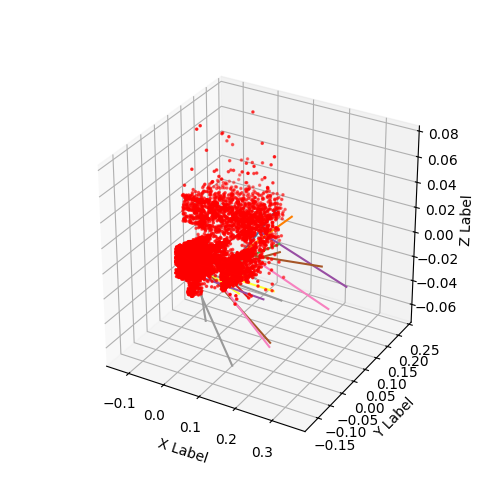

In [201]:

fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111, projection='3d')
ax.set_aspect('equal')

# Plot the scatter points
# arr_shape = gaussians_shape_xyz / 5.
# ax.scatter(arr_shape[:,0], 
#            arr_shape[:,1], 
#            arr_shape[:,2], c='b', marker='o',s=0.1)

# Plot the scatter points
arr = gaussians_target_xyz_torch.detach().cpu().numpy()

#arr = np.array(gaussians_target_xyz)
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], c='r', marker='o',s=2.4)

arr_rot = gaussians_target_rots_torch.detach().cpu().numpy() / 6e0
for i in range(len(indices)): 
    idx = indices[i]
    ax.plot([arr[idx,0], arr[idx,0] + arr_rot[idx,0]],
            [arr[idx,1], arr[idx,1] + arr_rot[idx,1]],
            [arr[idx,2], arr[idx,2] + arr_rot[idx,2]],
           color=colors[i])
            

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
plt.show()
#plt.close()

Text(0.5, 0, 'Z Label')

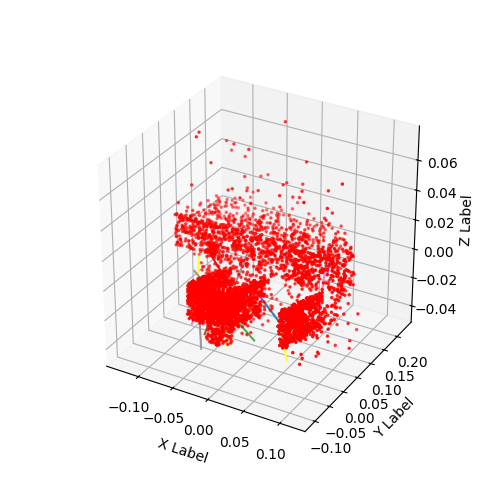

In [191]:

fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111, projection='3d')
ax.set_aspect('equal')

# Plot the scatter points
# arr_shape = gaussians_shape_xyz / 5.
# ax.scatter(arr_shape[:,0], 
#            arr_shape[:,1], 
#            arr_shape[:,2], c='b', marker='o',s=0.1)

# Plot the scatter points
arr = gaussians_target_xyz_torch.detach().cpu().numpy()

#arr = np.array(gaussians_target_xyz)
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], c='r', marker='o',s=2.4)

arr_rot = gaussians_rot.detach().cpu().numpy() * 1
for i in range(len(indices)): 
    idx = indices[i]
    ax.plot([arr[idx,0], arr[idx,0] + arr_rot[idx,0]],
            [arr[idx,1], arr[idx,1] + arr_rot[idx,1]],
            [arr[idx,2], arr[idx,2] + arr_rot[idx,2]],
           color=colors[i])
            

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

Text(0.5, 0, 'Z Label')

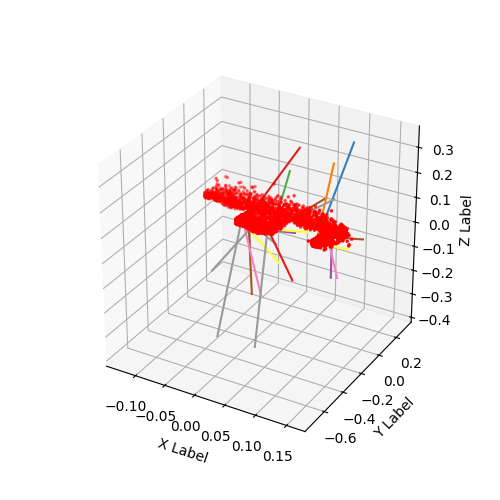

In [192]:

fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111, projection='3d')
ax.set_aspect('equal')

# Plot the scatter points
# arr_shape = gaussians_shape_xyz / 5.
# ax.scatter(arr_shape[:,0], 
#            arr_shape[:,1], 
#            arr_shape[:,2], c='b', marker='o',s=0.1)

# Plot the scatter points
arr = gaussians_target_xyz_torch.detach().cpu().numpy()

#arr = np.array(gaussians_target_xyz)
ax.scatter(arr[:,0], 
           arr[:,1], 
           arr[:,2], c='r', marker='o',s=2.4)

arr_rot = gaussians_rots_torch.detach().cpu().numpy() #/ 2e1
for i in range(len(indices)): 
    idx = indices[i]
    ax.plot([arr[idx,0], arr[idx,0] + arr_rot[idx,0]],
            [arr[idx,1], arr[idx,1] + arr_rot[idx,1]],
            [arr[idx,2], arr[idx,2] + arr_rot[idx,2]],
           color=colors[i])
            

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

yo


Text(0.5, 0, 'Z Label')

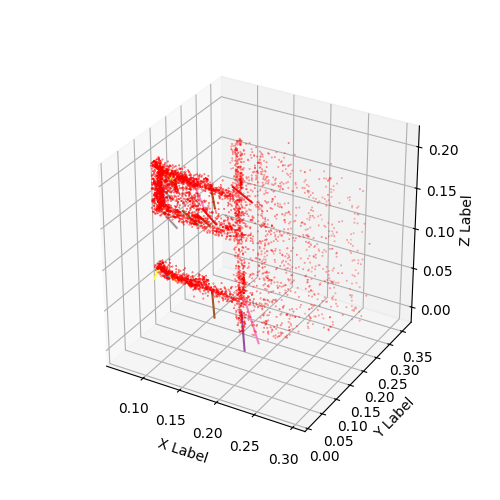

In [119]:
print("yo")
fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111, projection='3d')
ax.set_aspect('equal')

# Plot the scatter points
# arr_shape = gaussians_shape_xyz / 5.
# ax.scatter(arr_shape[:,0], 
#            arr_shape[:,1], 
#            arr_shape[:,2], c='b', marker='o',s=0.1)

# Plot the scatter points
arr = gaussians_xyz_torch_optimized.detach().cpu().numpy()

#arr = np.array(gaussians_target_xyz)
ax.scatter(arr[::1,0], 
           arr[::1,1], 
           arr[::1,2], c='r', marker='o',s=0.1)


arr_rot = gaussians_rots_torch.detach().cpu().numpy() / 150.
for i in range(len(indices)): 
    idx = indices[i]
    ax.plot([arr[idx,0], arr[idx,0] + arr_rot[idx,0]],
            [arr[idx,1], arr[idx,1] + arr_rot[idx,1]],
            [arr[idx,2], arr[idx,2] + arr_rot[idx,2]],
           color=colors[i])
            

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

In [172]:
indices

array([1088, 2327, 2619, 1767, 4589, 3789, 1281, 4480,  687, 1872, 4051,
        332, 3614, 4605, 1477, 4215, 2653, 1496, 3894, 1638])

Text(0.5, 0, 'Z Label')

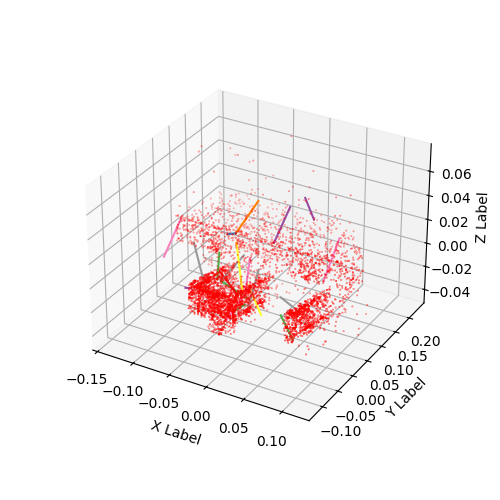

In [173]:

fig = plt.figure(figsize=(5,5))
ax = fig.add_subplot(111, projection='3d')


# Plot the scatter points
# arr_shape = gaussians_shape_xyz / 5.
# ax.scatter(arr_shape[:,0], 
#            arr_shape[:,1], 
#            arr_shape[:,2], c='b', marker='o',s=0.1)

# Plot the scatter points
arr = gaussians_xyz_torch.detach().cpu().numpy()

arr = np.array(gaussians_target_xyz)
ax.scatter(arr[::1,0], 
           arr[::1,1], 
           arr[::1,2], c='r', marker='o',s=0.1)

arr_rot = gaussians_rot.detach().cpu().numpy()  

arr_rot = (gaussians_rot / torch.norm(gaussians_rot, p=2, dim=1, keepdim=True)).detach().cpu().numpy()  * 0.04
for i in range(len(indices)): 
    idx = indices[i]
    ax.plot([arr[idx,0], arr[idx,0] + arr_rot[idx,0]],
            [arr[idx,1], arr[idx,1] + arr_rot[idx,1]],
            [arr[idx,2], arr[idx,2] + arr_rot[idx,2]],
           color=colors[i])
            

# Set labels for the axes
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')